### 1 Import Data

In [1]:
import pyedflib

# Path to your EDF file
file_path = '../datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf'

import mne

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)
print(raw.info)  # Print the information about the file

# Optionally, you can also view the data
data, times = raw[:, :]  # This reads all data and times from the file
print(data)  # You might want to summarize this as it could be very large

Extracting EDF parameters from /home/jovyan/Bio-Silicon-Synergetic-Intelligence-System/Software/CNN_feature_extraction_project/datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 86518  =      0.000 ...    86.518 secs...


/tmp/ipykernel_636/2224177845.py:9: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG A1-Ref, EEG A2-Ref, POL A3, POL A4, POL A5, POL A6, POL A7, ...
 chs: 126 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 2021-09-16 07:10:56 UTC
 nchan: 126
 projs: []
 sfreq: 1000.0 Hz
 subject_info: 3 items (dict)
>
[[ 2.35517136e-05  2.94240242e-05  3.59210486e-05 ...  1.44621265e-04
   1.37374584e-04  1.32126988e-04]
 [-3.48571123e-05 -3.97100436e-05 -4.26964629e-05 ...  1.61406629e-04
   1.55340464e-04  1.48154393e-04]
 [-6.23703785e+01 -6.16525255e+01 -6.12659893e+01 ... -5.71797494e+01
  -5.70693105e+01 -5.48053127e+01]
 ...
 [ 2.34186834e+02  2.36140019e+02  2.37311930e+02 ...  4.62904752e+01
   4.62904752e+01  4.58998383e+01]
 [ 1.18930357e+02  1.17368053e+02  1.17368053e+02 ...  3.41753899e+01
   3.41753899e+01  3.30036622e+01]
 [ 6.11251259e+01  6.11251259e+01  6.15157018e+01 ...  6.97177953e+01
   6.85460677e+01  6.85460677e+01]]


### Print shape

In [2]:
# Print the shape of the data
print("Shape of the channel data:", data.shape)

Shape of the channel data: (126, 86519)


### Skip these, unless you want to play around with different types of clustering for choosing the 32 channels of the 126 available

### Take 32 of the 126 channels, for easier computation

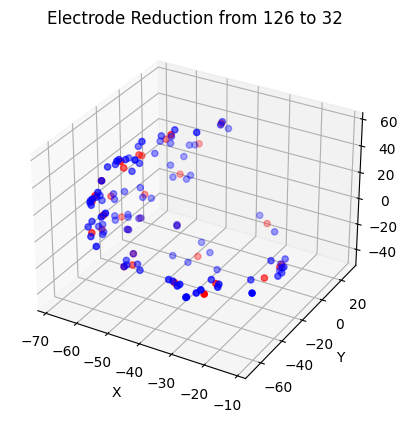

Reduced Electrode Positions:
[[-27.85814031 -40.31684621 -23.97160149]
 [-54.39412689 -39.95758533 -29.62439966]
 [-61.7605381  -26.33421326  29.73982716]
 [-62.96603966 -20.64176178 -22.48437691]
 [-66.50538635 -33.93398237 -15.12531233]
 [-65.66354752 -43.72083759  13.83248138]
 [-44.70439529  14.5089097   47.32616615]
 [-59.71897507 -34.11922798  41.15892181]
 [-20.68381786 -16.26154995 -32.79440308]
 [-54.87819672 -46.07836151 -26.63700485]
 [-31.43538284  19.85951424 -24.88890171]
 [-57.54696274 -55.462286    17.51754045]
 [-66.27940369 -17.17832208 -17.4206965 ]
 [-51.40499751 -12.59907309  52.19097392]
 [-58.86395073   3.57169628  33.39590693]
 [-52.12558365  -5.79620481 -22.27792549]
 [-63.26867676  -8.88824463 -22.2739296 ]
 [-63.25792694 -50.82478428  -3.17304855]
 [-22.44421705   6.79321273 -41.1067721 ]
 [-56.09159565   8.67492139   4.85150334]
 [-45.20814896  -6.18614278 -41.67867279]
 [-61.74101893  -8.24894333  -3.02000372]
 [-63.61161995  -5.26239724  23.61680603]
 [-24

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Plot original electrodes
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='b')

# Perform k-means clustering to reduce to 32 electrodes
centroids, _ = kmeans(electrodes, 32)
idx, _ = vq(electrodes, centroids)

# Plot reduced set of electrodes
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='r')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Electrode Reduction from 126 to 32')
plt.show()

# Print the coordinates of the reduced set of electrodes
print("Reduced Electrode Positions:")
print(centroids)


[[-2.80076804e+01 -6.11568766e+01 -1.59540172e+01]
 [-5.78286209e+01 -2.06463985e+01  4.82523689e+01]
 [-1.17276278e+01 -5.61787338e+01 -6.52857351e+00]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-6.27822752e+01 -9.96397805e+00 -1.97166240e+00]
 [-4.39641609e+01 -1.07794113e+01  5.72954102e+01]
 [-6.11816702e+01 -3.32536712e+01  3.93516321e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-6.09986331e+01 -2.37899590e+01  2.96610292e+01]
 [-5.24222107e+01 -6.37140942e+00  5.10251427e+01]
 [-6.29660397e+01 -2.06417618e+01 -2.24843769e+01]
 [-3.73621655e+01 -5.00781717e+01 -2.28959684e+01]
 [-5.64267731e+01  1.84721053e+01  1.77729836e+01]
 [-5.60915956e+01  8.67492139e+00  4.85150334e+00]
 [-5.96364775e+01  4.17969026e+00  2.91621461e+01]
 [-2.78581403e+01 -4.03168462e+01 -2.39716015e+01]
 [-4.55206960e+01  1.92354867e+01  4.24328410e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-6.24180590e+01 -7.50595490e+00  3.26809311e+01]
 [-4.55016670e+01 -1.03386326e+

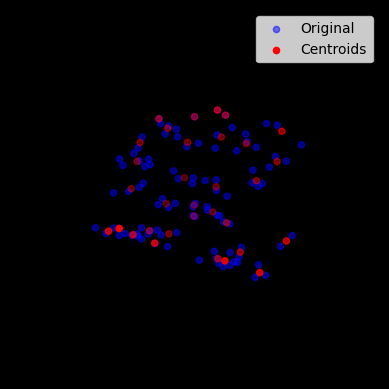

In [4]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
print(centroids)
# Scatter plot for the original electrodes
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='blue', alpha=0.5, label='Original')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red', label='Centroids')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
ax.legend()

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

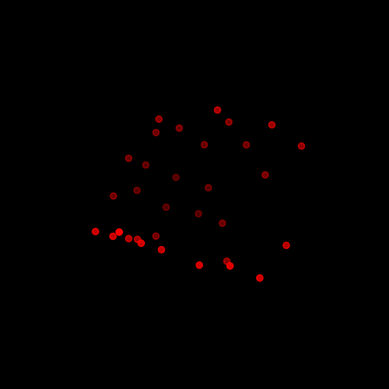

In [5]:
# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


[[-29.16187477 -37.24518585 -26.00351906]
 [-27.92510986 -67.06095886 -13.57040691]
 [-56.23524312  12.87371452  10.38928057]
 [-60.14871597 -51.94071865  20.46661782]
 [-28.03520393 -59.18884913 -16.74855391]
 [-55.24584961  -4.54792857  45.80199051]
 [-62.1334877  -15.68701696  28.48804903]
 [-11.72762775 -56.17873383  -6.52857351]
 [-60.57012081 -27.75347233  40.18649101]
 [-65.66354752 -43.72083759  13.83248138]
 [-64.25774829 -13.61906862  -1.1703217 ]
 [-22.44421705   6.79321273 -41.1067721 ]
 [-35.42736053 -52.10469818 -21.71963501]
 [-68.37722015 -29.09134579   4.28635222]
 [-55.09429995 -39.18231805 -29.47067928]
 [-31.43538284  19.85951424 -24.88890171]
 [-53.86819458 -37.58145523  48.3880806 ]
 [-64.80348969 -48.00426356  -2.89734641]
 [-39.29697037 -48.05164528 -24.07230186]
 [-23.58283615 -20.36078262 -33.24598694]
 [-57.6971302   -7.34222472 -22.27592754]
 [-59.63647747   4.17969026  29.16214609]
 [-43.96416092 -10.77941132  57.29541016]
 [-18.99953079  -6.92132874 -31.60

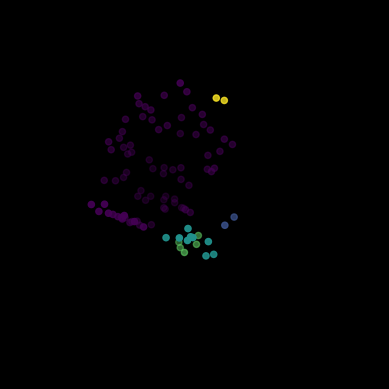

In [6]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])


# DBSCAN clustering
clustering = DBSCAN(eps=15, min_samples=2).fit(electrodes)
labels = clustering.labels_

# Positions for visualization are the points in each cluster
positions = electrodes[labels != -1]  # Exclude noise points if any

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], c=labels[labels != -1], cmap='viridis')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

[[-29.16187477 -37.24518585 -26.00351906]
 [-27.92510986 -67.06095886 -13.57040691]
 [-56.23524312  12.87371452  10.38928057]
 [-60.14871597 -51.94071865  20.46661782]
 [-28.03520393 -59.18884913 -16.74855391]
 [-55.24584961  -4.54792857  45.80199051]
 [-62.1334877  -15.68701696  28.48804903]
 [-11.72762775 -56.17873383  -6.52857351]
 [-60.57012081 -27.75347233  40.18649101]
 [-65.66354752 -43.72083759  13.83248138]
 [-64.25774829 -13.61906862  -1.1703217 ]
 [-22.44421705   6.79321273 -41.1067721 ]
 [-35.42736053 -52.10469818 -21.71963501]
 [-68.37722015 -29.09134579   4.28635222]
 [-55.09429995 -39.18231805 -29.47067928]
 [-31.43538284  19.85951424 -24.88890171]
 [-53.86819458 -37.58145523  48.3880806 ]
 [-64.80348969 -48.00426356  -2.89734641]
 [-39.29697037 -48.05164528 -24.07230186]
 [-23.58283615 -20.36078262 -33.24598694]
 [-57.6971302   -7.34222472 -22.27592754]
 [-59.63647747   4.17969026  29.16214609]
 [-43.96416092 -10.77941132  57.29541016]
 [-18.99953079  -6.92132874 -31.60

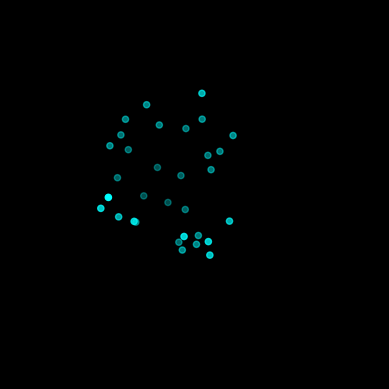

In [7]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# Define electrode positions
positions = np.array([
    [-59.40391604, -31.87375641, 42.341163],
    [-65.66354752, -43.72083759, 13.83248138],
    [-51.5124588, -11.66290092, -41.49539948],
    [-63.25792694, -50.82478428, -3.17304855],
    [-42.49627113, -9.67649841, -44.61089706],
    [-23.05419445, 7.13099909, -43.97796059],
    [-27.85814031, -40.31684621, -23.97160149],
    [-65.17494901, -18.33280198, -19.10858997],
    [-57.6971302, -7.34222472, -22.27592754],
    [-46.37048721, 0.7046715, -36.41254807],
    [-58.74309158, 7.24900675, 11.08596802],
    [-63.44809469, -6.69529626, 27.03591665],
    [-67.79295731, -25.01029778, 2.35935596],
    [-60.99863307, -23.78995895, 29.66102918],
    [-55.09429995, -39.18231805, -29.47067928],
    [-31.43538284, 19.85951424, -24.88890171],
    [-11.72762775, -56.17873383, -6.52857351],
    [-62.7822752, -9.96397805, -1.9716624],
    [-57.54696274, -55.462286, 17.51754045],
    [-19.76341502, -9.16123772, -31.87477811],
    [-37.36216545, -50.07817173, -22.89596844],
    [-43.1652565, -0.61948764, -41.26362228],
    [-21.22426224, 6.11764002, -35.36439514],
    [-57.00943756, 14.88790417, 13.78476715],
    [-62.75046921, -48.41915131, 23.41569519],
    [-28.00768042, -61.15687656, -15.95401716],
    [-55.20776367, 9.15022628, 2.77334845],
    [-61.72004318, -45.41010666, 33.16564178],
    [-53.14139303, 23.07235082, 24.06012472],
    [-58.86395073, 3.57169628, 33.39590693],
    [-66.50538635, -33.93398237, -15.12531233],
    [-46.44879055, 2.96674967, 50.74322128]
])


# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], color='cyan')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

### 2 Use this to choose the channels, based on centroids

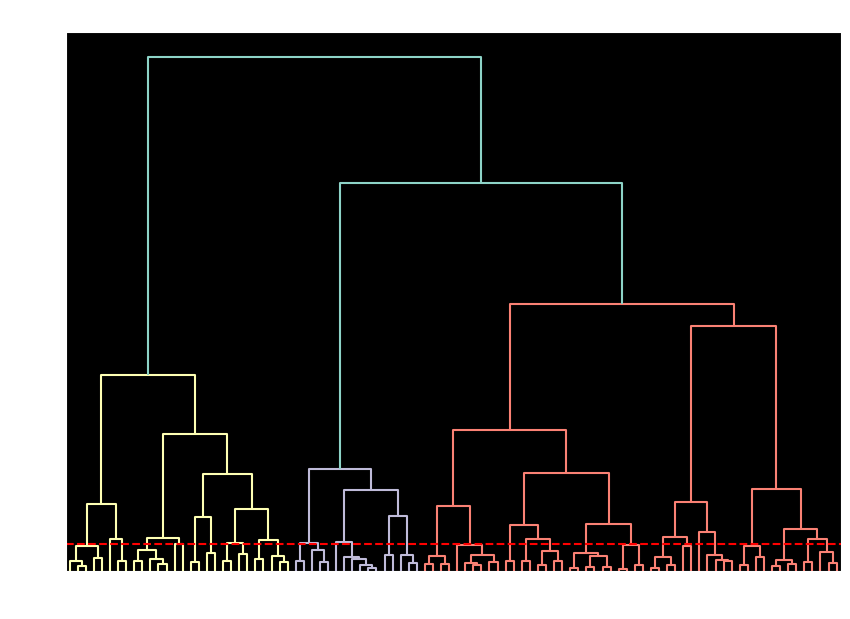

Number of clusters formed: 32
[[-5.62751640e+01  9.91751795e+00  6.63815610e+00]
 [-5.61354408e+01  2.02642059e+01  1.97670918e+01]
 [-4.71532974e+01  2.86886406e+01  3.26461906e+01]
 [-6.16746635e+01 -3.22859821e+01  3.79802750e+01]
 [-5.58484077e+01 -2.91139269e+01  4.83202248e+01]
 [-4.47043953e+01  1.45089097e+01  4.73261662e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-5.96746311e+01 -2.14773254e+01  2.82441206e+01]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.75661621e+01  4.43123341e-01  3.85660591e+01]
 [-6.04943581e+01  4.36935555e+00  2.66984348e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.89995308e+01 -6.92132874e+00 -3.16005363e+01]
 [-2.35828362e+01 -2.03607826e+01 -3.32459869e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-6.65053864e+01 -3.39339824e+01 -1.51253123e+01]
 [-5.50943000e+01 -3.91823181e+01 -2.94706793e+01]
 

/tmp/ipykernel_636/1235004596.py:139: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')


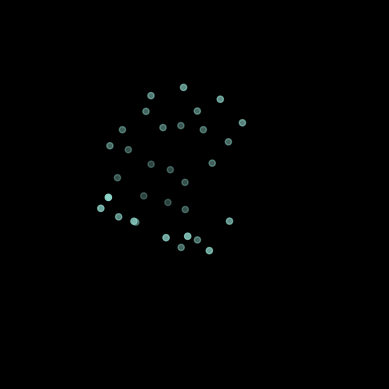

In [8]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    #[-27.0217590332031, -40.117847442627, -23.9372749328613], # A2 (omitted because its a ref)
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform hierarchical clustering
Z = linkage(electrodes, 'ward')  # 'ward' method minimizes the variance within clusters

# Plot the dendrogram to determine a suitable cut-off
plt.figure(figsize=(10, 7))
plt.style.use('dark_background')  # Set background color to black
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Electrode Index')
plt.ylabel('Distance')
plt.axhline(y=17.5, color='r', linestyle='--')  # Example line to visualize the current cut-off
plt.show()

# Experiment with this value to get approximately 32 clusters:
cut_off_distance = 17.5  # You might need to adjust this based on the dendrogram

# Form flat clusters
clusters = fcluster(Z, cut_off_distance, criterion='distance')

# Calculate the number of clusters and adjust if necessary
actual_number_of_clusters = len(np.unique(clusters))
print(f"Number of clusters formed: {actual_number_of_clusters}")
# Calculate centroids of these clusters
centroids = np.array([electrodes[clusters == k].mean(axis=0) for k in np.unique(clusters)])
print(centroids)

# Create a 3D figure for visualization
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')

# Configure plot aesthetics
ax.grid(False)
ax.axis('off')
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


### 3 match the centroids we found to the actual ecog channels in the dataset

In [9]:
import numpy as np
from scipy.spatial import cKDTree

# Given electrode positions and their names
# Electrode positions
electrode_positions = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    #[-27.0217590332031, -40.117847442627, -23.9372749328613], # A2 (omitted because its a ref)
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Electrode names corresponding to the positions in electrode_positions
electrode_names = [
    "A1", "A10", "A11", "A12", "A13", "A14", "A15", "A16",
    "A17", "A18", "A19", "A20", "A21", "A22", "A23",
    "A24", "A25", "A26", "A27", "A28", "A29", "A3", "A30",
    "A31", "A32", "A33", "A34", "A35", "A36", "A37", "A38",
    "A39", "A4", "A40", "A41", "A42", "A43", "A44", "A45",
    "A46", "A47", "A48", "A49", "A5", "A6", "A7", "A8",
    "A9", "B12", "B13", "B14", "B15", "B16", "B17", "B18",
    "B19", "B20", "B21", "B22", "B23", "B24", "B25", "B26",
    "B27", "B28", "B29", "B30", "B31", "B32", "B33", "B34",
    "B35", "B36", "B37", "B38", "B39", "B4", "B40", "B41",
    "B42", "B43", "B44", "B45", "B46", "B47", "B48", "B49",
    "B5", "B50", "B51", "B52", "B53", "B54", "B55", "B56",
    "B57", "B58", "B59", "B6", "B60", "B61", "B62", "B63",
    "B64", "B7", "B8", "B9"
]


# Create a KD-tree for quick nearest-neighbor lookup
tree = cKDTree(electrode_positions)

# Find the closest electrode for each centroid
distances, indices = tree.query(centroids, k=1)

# Map centroids to electrode names using the indices
matched_names = [electrode_names[idx] for idx in indices]

# Output matched names
for centroid, name in zip(centroids, matched_names):
    print(f"Centroid {centroid} matched to Electrode {name}")

# Optionally, you can also inspect the distance to confirm a good match
for dist, name in zip(distances, matched_names):
    print(f"Electrode {name} with distance {dist:.2f}")

# Count the number of matched electrodes
num_matched_electrodes = len(matched_names)

# Output the number of matched electrodes
print(f"Number of matched electrodes: {num_matched_electrodes}")


Centroid [-56.27516403   9.91751795   6.6381561 ] matched to Electrode B21
Centroid [-56.13544083  20.26420593  19.76709175] matched to Electrode A48
Centroid [-47.15329742  28.68864059  32.64619064] matched to Electrode B56
Centroid [-61.67466354 -32.28598213  37.98027496] matched to Electrode A5
Centroid [-55.84840775 -29.11392689  48.32022476] matched to Electrode B57
Centroid [-44.70439529  14.5089097   47.32616615] matched to Electrode B55
Centroid [-48.19318581  -8.57541037  54.16027641] matched to Electrode B4
Centroid [-59.67463112 -21.47732544  28.2441206 ] matched to Electrode B17
Centroid [-64.59234428  -9.89670849  28.73197746] matched to Electrode B18
Centroid [-57.56616211   0.44312334  38.56605911] matched to Electrode A46
Centroid [-60.49435806   4.36935555  26.69843483] matched to Electrode A9
Centroid [-4.47678719e+01  4.25919294e-02 -3.88380852e+01] matched to Electrode A16
Centroid [-45.50166702 -10.33863258 -43.57239787] matched to Electrode A18
Centroid [-18.99953

### 4 Plot to check the signals

Extracting EDF parameters from /home/jovyan/Bio-Silicon-Synergetic-Intelligence-System/Software/CNN_feature_extraction_project/datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 214489  =      0.000 ...   214.489 secs...


/tmp/ipykernel_636/2460594448.py:10: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)


Adjusted matched names: ['POL B21', 'POL A48', 'POL B56', 'POL A5', 'POL B57', 'POL B55', 'POL B4', 'POL B17', 'POL B18', 'POL A46', 'POL A9', 'POL A16', 'POL A18', 'POL A12', 'POL A39', 'POL A43', 'POL A13', 'POL B51', 'POL A38', 'POL B25', 'POL B37', 'POL B36', 'POL B44', 'POL B54', 'POL A34', 'POL A3', 'POL A24', 'POL A31', 'POL B48', 'POL B33', 'POL B40', 'POL B22']
Number of plots plotted: 32


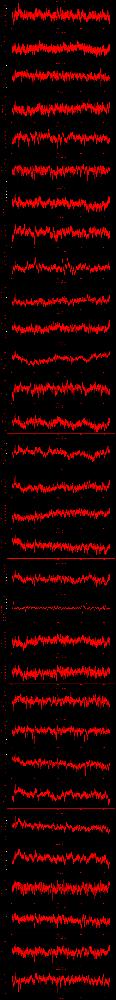

In [10]:
import pyedflib
import mne
import matplotlib.pyplot as plt
import numpy as np

# Path to your EDF file
file_path = '../datasets/raw/sub-01_ses-task_task-game_run-01_ieeg.edf'

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)

# Electrode names matched to centroids (retrieved from your earlier analysis)
matched_names = ['B21', 'A48', 'B56', 'A5', 'B57', 'B55', 'B4', 'B17', 'B18', 'A46', 'A9', 'A16', 'A18', 'A12', 'A39', 'A43', 'A13', 'B51', 'A38', 'B25', 'B37', 'B36', 'B44', 'B54', 'A34', 'A3', 'A24', 'A31', 'B48', 'B33', 'B40', 'B22']

# Function to generate the corresponding channel names with the "POL" prefix
def generate_pol_channel_name(name):
    if name.startswith('POL'):
        return name
    elif name.startswith('EEG'):
        return f'POL {name[4:]}'
    else:
        # Handle other prefixes as needed
        return f'POL {name}'  # Assuming other prefixes can be safely prefixed with "POL"

# Adjusted matched names with "POL" prefix
adjusted_matched_names = [generate_pol_channel_name(name) for name in matched_names]

print("Adjusted matched names:", adjusted_matched_names)

# Filter to keep only the indices of channels that are in adjusted_matched_names
indices = [raw.ch_names.index(name) for name in adjusted_matched_names if name in raw.ch_names]

print("Number of plots plotted:", len(indices))  # Print the number of plots plotted

# Extract data for these channels
selected_data, times = raw[indices, :]

# Plotting
plt.figure(figsize=(15, 4 * len(indices)), facecolor='black')
for i, idx in enumerate(indices):
    plt.subplot(len(indices), 1, i + 1)
    plt.plot(times, selected_data[i], color='red', linewidth=0.5)
    plt.title(f'Channel {raw.ch_names[idx]}', color='red', fontsize=10)
    plt.xlabel('Time (s)', color='red')
    plt.ylabel('Amplitude (µV)', color='red')
    plt.xticks(color='red')
    plt.yticks(color='red')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_color('red')
    plt.gca().spines['left'].set_color('red')
    plt.gca().set_facecolor('black')

plt.tight_layout()
plt.show()


### Remove the "POL " from each channel name and save each channel as npy

In [11]:
import numpy as np

# Assuming 'selected_data' contains the data for channels and 'adjusted_matched_names' contains the channel names like "POL A62"
clean_names = [name[4:] for name in adjusted_matched_names]  # List comprehension to strip the first four characters from each name

# Save both the channel names and the data to a .npz file
np.savez('../datasets/interim/all_channels_data.npz', data=selected_data, names=clean_names)

### See what the channels are named

In [12]:
print(raw.ch_names)  # Print the first 30 channel names to get an idea of the naming format

matched_names = ['B21', 'A47', 'B56', 'A5', 'B57', 'B55', 'B4', 'B17', 'B18', 'A46', 'A9', 'A16', 'A18', 'A12', 'A39', 'A10', 'A13', 'A24', 'A31', 'A34', 'A2', 'B48', 'B33', 'B40', 'B22', 'B51', 'A38', 'B25', 'B37', 'B36', 'B44', 'B54']


['EEG A1-Ref', 'EEG A2-Ref', 'POL A3', 'POL A4', 'POL A5', 'POL A6', 'POL A7', 'POL A8', 'POL A9', 'POL A10', 'POL A13', 'POL A14', 'POL A15', 'POL A16', 'POL A17', 'POL A18', 'POL A19', 'POL A20', 'POL A21', 'POL E', 'POL A22', 'POL A23', 'POL A11', 'POL A12', 'POL A24', 'POL A25', 'POL A26', 'POL A27', 'POL A28', 'POL A29', 'POL A30', 'POL A31', 'POL A32', 'POL A33', 'POL A34', 'POL A35', 'POL A36', 'POL DC01', 'POL DC02', 'POL DC03', 'POL DC04', 'POL SPO2', 'POL A37', 'POL A38', 'POL $A11', 'POL $A12', 'POL A39', 'POL A40', 'POL A41', 'POL A42', 'POL A43', 'POL A44', 'POL A45', 'POL A46', 'POL A47', 'POL A48', 'POL A49', 'POL A50', 'POL B1', 'POL B2', 'POL B3', 'POL B4', 'POL B5', 'POL B6', 'POL B7', 'POL B8', 'POL B9', 'POL B10', 'POL B11', 'POL B12', 'POL B13', 'POL B14', 'POL B15', 'POL B16', 'POL B17', 'POL B18', 'POL B19', 'POL B20', 'POL B21', 'POL B22', 'POL B23', 'POL B24', 'POL B25', 'POL B26', 'POL B27', 'POL B28', 'POL B29', 'POL B30', 'POL B31', 'POL B32', 'POL B33', 'PO

### Feature extraction (need to work on this)

In [13]:
%%capture 

import numpy as np
from scipy.signal import find_peaks, welch, hilbert
from scipy.fft import fft, fftfreq
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw  
from PyEMD import EMD

def detect_peaks_single_block(signals):
    # Reshape the signals array into a 1-D array
    flattened_signals = signals.flatten()

    # Dynamically setting parameters based on signal characteristics
    median_height = np.median(flattened_signals)
    std_height = np.std(flattened_signals)
    height = median_height + std_height  # Setting height to be above median + 1 std deviation
    distance = len(flattened_signals) * 0.05  # Example to set distance to 5% of signal length
    prominence = std_height * 0.5  # Setting prominence to be half of std deviation

    # Detecting peaks
    peaks, properties = find_peaks(flattened_signals, height=height, distance=distance, prominence=prominence)

    # Calculating properties if peaks were found
    if peaks.size > 0:
        peak_count = len(peaks)
        average_peak_height = np.mean(properties["peak_heights"])
        average_distance = np.mean(np.diff(peaks)) if len(peaks) > 1 else 0
        average_prominence = np.mean(properties["prominences"])
    else:
        peak_count = 0
        average_peak_height = 0
        average_distance = 0
        average_prominence = 0

    # Create a numpy array with the results
    peak_results = np.array([peak_count,average_peak_height, average_distance, average_prominence, median_height, std_height, distance, prominence])
    
    # Print all variables calculated
    print("Median Height:", median_height)
    print("Standard Deviation of Height:", std_height)
    print("Height Threshold:", height)
    print("Peak Distance:", distance)
    print("Prominence Threshold:", prominence)
    print("Peak Count:", peak_count)
    print("Average Peak Height:", average_peak_height)
    print("Average Distance Between Peaks:", average_distance)
    print("Average Prominence of Peaks:", average_prominence)
    print("Peaks Indices:", peaks)
    print("Properties:", properties)

    return peak_results

def detect_peaks(blocks):
    peaks_results = []

    for signals in blocks:
        # Reshape the signals array into a 1-D array
        flattened_signals = signals.flatten()

        # Dynamically setting parameters based on signal characteristics
        median_height = np.median(flattened_signals)
        std_height = np.std(flattened_signals)
        height = median_height + std_height  # Setting height to be above median + 1 std deviation
        distance = len(flattened_signals) * 0.05  # Example to set distance to 5% of signal length
        prominence = std_height * 0.5  # Setting prominence to be half of std deviation

        # Detecting peaks
        peaks, properties = find_peaks(flattened_signals, height=height, distance=distance, prominence=prominence)

        # Calculating properties if peaks were found
        if peaks.size > 0:
            peak_count = len(peaks)
            average_peak_height = np.mean(properties["peak_heights"])
            average_distance = np.mean(np.diff(peaks)) if len(peaks) > 1 else 0
            average_prominence = np.mean(properties["prominences"])
        else:
            peak_count = 0
            average_peak_height = 0
            average_distance = 0
            average_prominence = 0

        # Appending results for the current block, including all variables
        peaks_results.append({
            "peak_count": peak_count,
            "average_peak_height": average_peak_height,
            "average_distance": average_distance,
            "average_prominence": average_prominence,
            "median_height": median_height,
            "std_height": std_height,
            "height": height,
            "distance": distance,
            "prominence": prominence,
        })

        # Print all variables calculated
        print("Median Height:", median_height)
        print("Standard Deviation of Height:", std_height)
        print("Height Threshold:", height)
        print("Peak Distance:", distance)
        print("Prominence Threshold:", prominence)
        print("Peak Count:", peak_count)
        print("Average Peak Height:", average_peak_height)
        print("Average Distance Between Peaks:", average_distance)
        print("Average Prominence of Peaks:", average_prominence)
        print("Peaks Indices:", peaks)
        print("Properties:", properties)
    return peaks_results

def calculate_variance(signals):
    # Calculating variance  
    variance = np.var(signals, axis=1)

    # Print variance  for each signal
    for i, var in enumerate(variance):
        print(f"Signal {i + 1}: Variance = {var}")
        

    return variance 

def calculate_std_dev(signals):
    # standard deviation

    std_dev = np.std(signals, axis=1)

    # Print standard deviation for each signal
    for i, std in enumerate(std_dev):
        print(f"Signal {i + 1}:  Standard Deviation = {std}")
    return std_dev


def calculate_rms(signals):
    # Calculating RMS value
    rms = np.sqrt(np.mean(signals ** 2, axis=1))

    # Print RMS value for each signal
    for i, rms_value in enumerate(rms):
        print(f"Signal {i + 1}: RMS = {rms_value}")
    return rms


def freq_bands(signals, fs):
    # Initialize the band features array
    band_features = np.zeros((signals.shape[0], 4))

    # Define frequency bands
    bands = {'delta': (1, 4), 'theta': (4, 8), 'alpha': (8, 13), 'beta': (13, 30)}

    for i, signal in enumerate(signals):
        # Use a sensible nperseg; generally a power of 2 or at least 256 for decent frequency resolution
        nperseg = min(256, len(signal)) if len(signal) > 256 else len(signal)

        # Calculate the power spectral density for the actual signal
        frequencies, psd = welch(signal, fs, nperseg=nperseg)

        # Iterate over the band definitions to calculate the mean PSD in each band
        for j, (name, (low, high)) in enumerate(bands.items()):
            idx = np.logical_and(frequencies >= low, frequencies <= high)
            band_features[i, j] = np.nanmean(psd[idx]) if np.any(idx) else 0.0
            print(f"Signal {i + 1}, Band {name}: Mean PSD = {band_features[i, j]}")

    return band_features

def calculate_spectral_entropy(neural_data_array, fs):
    # Initialize an array to hold spectral entropy values for each channel
    spectral_entropy_values = np.zeros(neural_data_array.shape[0])

    for i, signal in enumerate(neural_data_array):
        # Determine nperseg based on the length of the signal
        nperseg = min(len(signal), fs * 2)
        # Calculate the power spectral density (PSD) using Welch's method
        frequencies, psd = welch(signal, fs=fs, nperseg=nperseg)

        # Check if the sum of psd is zero
        if np.sum(psd) == 0:
            spectral_entropy_values[i] = 0.0  # Set spectral entropy to 0
        else:
            # Normalize the PSD to get a probability distribution for entropy calculation
            normalized_psd = psd / np.sum(psd)
            # Calculate the spectral entropy
            spectral_entropy = -np.sum(normalized_psd * np.log2(normalized_psd))
            # Store the spectral entropy value in the array
            spectral_entropy_values[i] = spectral_entropy
            print(f"Channel {i + 1}: Spectral Entropy = {spectral_entropy}")
            print(f"Channel {i + 1}: Normalized PSD = {normalized_psd}")

    return spectral_entropy_values


def spectral_centroids(signals, fs):
    # Calculate the spectral centroids for each signal
    centroids = []
    for i, signal in enumerate(signals):
        fft_result = fft(signal)
        frequencies = fftfreq(len(signal), 1.0 / fs)
        magnitude = np.abs(fft_result)
        centroid = np.sum(frequencies * magnitude) / np.sum(magnitude)
        centroids.append(centroid)
        print(f"Signal {i + 1}: Spectral Centroid = {centroid}")
        print(f"Signal {i + 1}: FFT Result = {fft_result}")
        print(f"Signal {i + 1}: Frequencies = {frequencies}")
        print(f"Signal {i + 1}: Magnitude = {magnitude}")
    return centroids

def spectral_edge_density(signals, fs, percentage=95):
    spectral_edge_densities = []

    for i, signal in enumerate(signals):
        fft_result = fft(signal)
        frequencies = fftfreq(len(signal), 1.0 / fs)
        positive_frequencies = frequencies[frequencies >= 0]
        positive_fft_result = fft_result[frequencies >= 0]
        magnitude = np.abs(positive_fft_result)
        cumulative_sum = np.cumsum(np.sort(magnitude)[::-1])
        total_power = np.sum(magnitude)
        threshold = total_power * (percentage / 100)
        spectral_edge = positive_frequencies[np.argmax(cumulative_sum >= threshold)]
        spectral_edge_densities.append(spectral_edge)
        print(f"Signal {i + 1}: Spectral Edge Density = {spectral_edge}")
        print(f"Signal {i + 1}: Positive Frequencies = {positive_frequencies}")
        print(f"Signal {i + 1}: Positive FFT Result = {positive_fft_result}")
        print(f"Signal {i + 1}: Magnitude = {magnitude}")
        print(f"Signal {i + 1}: Cumulative Sum = {cumulative_sum}")
        print(f"Signal {i + 1}: Total Power = {total_power}")
        print(f"Signal {i + 1}: Threshold = {threshold}")

    return spectral_edge_densities


def phase_locking_values(signals):
    # Compute the analytical signal for each input signal
    num_signals = signals.shape[0]
    plv_matrix = np.zeros((num_signals, num_signals))

    for i in range(num_signals):
        for j in range(i + 1, num_signals):  # Only compute for unique pairs
            signal1 = signals[i]
            signal2 = signals[j]

            # Compute the analytical signal for each input signal
            analytic_signal1 = hilbert(signal1)
            analytic_signal2 = hilbert(signal2)

            # Compute the instantaneous phase for each analytical signal
            phase1 = np.angle(analytic_signal1)
            phase2 = np.angle(analytic_signal2)

            # Print phases for each channel
            print(f"Channel {i + 1} Phase: {phase1}")
            print(f"Channel {j + 1} Phase: {phase2}")

            # Compute the phase difference
            phase_diff = phase1 - phase2

            # Compute the PLV
            plv = np.abs(np.sum(np.exp(1j * phase_diff)) / len(signal1))

            # Store the PLV in the matrix
            plv_matrix[i, j] = plv
            plv_matrix[j, i] = plv  # PLV is symmetric

    # Print the PLV matrix
    print("PLV Matrix:")
    print(plv_matrix)

    return plv_matrix


def calculate_higuchi_fractal_dimension(signals, k_max):
    hfd_values = []  # To store HFD for each channel

    for i, signal in enumerate(signals):
        N = len(signal)
        L = []
        x = np.asarray(signal)
        for k in range(1, k_max + 1):
            Lk = []
            for m in range(k):
                Lkm_sum = 0
                max_index = int((N - m - 1) / k) + 1  # Ensures valid indexing
                for j in range(1, max_index):
                    Lkm_sum += abs(x[m + j * k] - x[m + (j - 1) * k])
                if max_index - 1 > 0:  # Check to avoid division by zero
                    Lkm = Lkm_sum * (N - 1) / (k * (max_index - 1))
                    Lk.append(Lkm)
                else:
                    Lk.append(0)  # Or handle appropriately

            # Check if Lk contains non-zero values before taking log
            if np.mean(Lk) > 0:
                L.append(np.log(np.mean(Lk)))
            else:
                # Handle the case where np.mean(Lk) results in 0 or a negative number
                # For example, append a very small positive value or handle as an error
                L.append(np.log(np.finfo(float).eps))  # Using machine epsilon for a small positive number

        # Proceed with polyfit only if L contains valid log values
        if len(L) > 0 and np.all(np.isfinite(L)):
            hfd = np.polyfit(np.log(range(1, k_max + 1)), L, 1)[0]  # Linear fit to log-log plot
            hfd_values.append(hfd)
            print(f"Channel {i + 1}: Higuchi Fractal Dimension = {hfd}")
        else:
            # Handle the case where HFD cannot be computed due to invalid L values
            hfd_values.append(np.nan)  # Append NaN or another placeholder to indicate failure

    return hfd_values

def calculate_zero_crossing_rate(signals):
    sign_changes = np.diff(np.sign(signals), axis=1)
    zero_crossings = np.count_nonzero(sign_changes, axis=1)
    zero_crossing_rates = zero_crossings / (signals.shape[1] - 1)

    # Print sign changes and zero crossings rates for each signal
    for i, (sign_change, zero_crossing_rate) in enumerate(zip(sign_changes, zero_crossing_rates)):
        print(f"Signal {i + 1}: Sign Changes = {sign_change}")
        print(f"Signal {i + 1}: Zero Crossing Rate = {zero_crossing_rate}")

    return zero_crossing_rates

def perform_empirical_mode_decomposition(signals):
    emd = EMD()
    imfs_all_signals = []

    for i, signal in enumerate(signals):
        imfs = emd(signal)
        # appending how many imfs were extracted instead since this features is variable
        imfs_all_signals.append(imfs.shape[0])
        print(f"IMFs for Signal {i + 1}:")
        for j, imf in enumerate(imfs):
            print(f"IMF {j + 1}: {imf}")

    # Convert the list of number of IMFs per channel into a NumPy array of type object
    imfs_all_signals = np.array(imfs_all_signals, dtype=object)

    return imfs_all_signals

def evolution_rate(signals):
    rates = np.zeros(signals.shape[0])

    for i, signal in enumerate(signals):
        analytic_signal = hilbert(signal)
        envelope = np.abs(analytic_signal)
        derivative = np.diff(envelope)
        rates[i] = np.mean(np.abs(derivative))

        print(f"Analytic Signal for Signal {i + 1}:", analytic_signal)
        print(f"Envelope for Signal {i + 1}:", envelope)
        print(f"Derivative for Signal {i + 1}:", derivative)
        print(f"Evolution Rate for Signal {i + 1}:", rates[i])

    return rates

# Constants
ORIGINAL_SAMPLING_RATE = 1000  # Original sampling rate of the data
TARGET_SAMPLING_RATE = 250  # (change to 500hz when you need) Target sampling rate after subsampling; this is the effective sampling rate of the live system
WINDOW_SIZE_MS = 200 # in the live system, we calcluate features based on 200ms worth of data

# Initial Data Preparation
def preprocess_data(data, target_freq=TARGET_SAMPLING_RATE, window_size_ms=WINDOW_SIZE_MS):
    num_channels, num_samples = data.shape
    original_freq = ORIGINAL_SAMPLING_RATE  # Original sampling frequency (1000Hz)
    
    # Subsample the data to the target frequency
    subsampling_factor = original_freq // target_freq
    subsampled_data = data[:, ::subsampling_factor]
    
    # Calculate the window size and stride in samples
    window_size_samples = int(window_size_ms * target_freq / ORIGINAL_SAMPLING_RATE)
    stride_samples = window_size_samples
    
    # Create buckets of data
    num_subsampled_samples = subsampled_data.shape[1]
    num_buckets = (num_subsampled_samples - window_size_samples) // stride_samples + 1
    
    buckets = np.zeros((num_buckets, num_channels, window_size_samples))
    for i in range(num_buckets):
        start = i * stride_samples
        end = start + window_size_samples
        buckets[i] = subsampled_data[:, start:end]
    
    return buckets

def analyze_bucket(bucket):
    features = {
        "peaks": detect_peaks_single_block(bucket),
        "std": calculate_std_dev(bucket),
        "variance": calculate_variance(bucket),
        "rms": calculate_rms(bucket),
        "freq_bands": freq_bands(bucket, TARGET_SAMPLING_RATE).flatten(),
        "spectral_entropy": calculate_spectral_entropy(bucket, TARGET_SAMPLING_RATE),
        "spectral_centroids": spectral_centroids(bucket, TARGET_SAMPLING_RATE),
        "spectral_edge_density": spectral_edge_density(bucket, TARGET_SAMPLING_RATE, 95),
        "phase_locking_values": phase_locking_values(bucket).flatten(),
        "higuchi_fractal_dimension": calculate_higuchi_fractal_dimension(bucket, k_max=10),
        "zero_crossing_rates": calculate_zero_crossing_rate(bucket),
        "num_empirical_mode_decomposition_imfs_per_channel": perform_empirical_mode_decomposition(bucket),
        "evolution_rate": evolution_rate(bucket)
    }
    return features

def preprocess_targets(targets):
    preprocessed_targets = []
    for target in targets:
        block_targets = {}
        for feature_name, feature_value in target.items():
            if isinstance(feature_value, np.ndarray):
                block_targets[feature_name] = feature_value.flatten()
            elif isinstance(feature_value, list):
                block_targets[feature_name] = np.array(feature_value).flatten()
            else:
                block_targets[feature_name] = feature_value
        preprocessed_targets.append(block_targets)
    return preprocessed_targets

# Load the data
loaded_data = np.load('../datasets/interim/all_channels_data.npz')
selected_data = loaded_data['data']
clean_names = loaded_data['names']

# Create channel info dictionary
channel_info = {
    "names": clean_names,
    "num_channels": len(clean_names)
}

# Preprocess the data into buckets
buckets = preprocess_data(selected_data)

# Analyze each bucket
targets = [analyze_bucket(bucket) for bucket in buckets]

# Preprocess the targets
preprocessed_targets = preprocess_targets(targets)

# Save the preprocessed dataset with channel information
dataset = {
    "buckets": buckets,
    "targets": preprocessed_targets,
    "channel_info": channel_info
}

import pickle

# rename the dataset to 500Hz when you need
with open("../datasets/processed/ecog_dataset_livesystem_250hz_32channel.pkl", "wb") as file:
    pickle.dump(dataset, file)